<a href="https://colab.research.google.com/github/jbuxt/GEOM180_teaching/blob/main/Geom180_Workshop_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **GEOM180 Workshop 5: Creating and exporting visual and numerical output**

This week we will be discussing designing and making scientific figures, as well as exporting data from GEE.

We will repeat some of the activities that we did at the end of last week with the Night Time Lights dataset, and will continue to apply this to Puerto Rico to provide some measure of the impact of Hurricane Maria in 2017.

Today's session will use both GEE, in this Colab notebook environment, and QGIS, for which I have created a seperate document for you to work through.

The structure of today's session is as follows:


*  Group discussion around what makes a good figure or map
*  Improving plots in GEE and some limitations
*  Making plots/maps in Python
*  Exporting data from GEE
*  Plotting in QGIS

In this workshop, I will try to briefly distinguish between plotting processes that use server side objects and client (or Python) side objects. The general rule of thumb is that if it starts with `ee`, such as `ee.ImageCollection`, then it is a server side object. If you have created a list or dataframe with a Python package, then it will often be a client side object.

For more details, see here this [GEE guide](https://developers.google.com/earth-engine/guides/client_server).

Any questions, just ask Josh, Joseph or Steve during the session, or email Josh on j.buxton@exeter.ac.uk.

Workshop date: 4th December 2023

Next week: Open session - time to work on code for your coursework.


# **Task 1: Import initial package and validate Google Earth Engine connection.**

As with the last workshop, these steps are required to connect to Google Earth Engine. You will need to do this everytime you load up Earth Engine!

In [ ]:
import ee

# Trigger the authentication flow.
ee.Authenticate()

# Initialize the library.
ee.Initialize()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=DGCtohuNkYWooJJGh6T6hMYHGoIFL_c6SfwIbjl_NMI&tc=fqHtD2DkWK7z-KwigCuvb5XuJIkRnaj6PKzKHufpqnM&cc=7Zoju3DSHXspmwJVxcoMVIybxytkSR05Csw5ggkiiy8

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AfJohXn7x3OdCIsEnRf8c17Fv6z3hKNmGKJ_dVjX67vIZAk8oDhuFZtSeu8

Successfully saved authorization token.


In [ ]:
import geemap

import os
from geemap.conversion import *

# **Task 2: Connect Google Drive to Colab**

In order to easily access your files which are stored in Google Drive, you should mount Google Drive in colab environment.

In the navigation bar on the left of the screen, click the "Files" button. This will open up a panel which allows you to view all of your files. At the top are four buttons, one of which has the Google Drive logo on it. Click this to mount Google Drive, this will then add a drive folder to the files list.

Alternatively you can do this with the code provided below.

In [ ]:
#Use this code to connect between Google Drive and this colab document.

from google.colab import drive
drive.mount('/content/drive')

MessageError: ignored

# **Importing Python packages for making figures**

For some of the following tasks we will require additional Python packages, import them with the code below.


In [ ]:
#Import new Python packages

import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from scipy.stats import pearsonr
import geemap.chart as chart



# **Task 3: Make scatter plots: Light level and population density**

You may remember from last week that we were working with a night time lights dataset as a proxy for infrastructure changes in Puerto Rico after a hurricane.

Here we will make scatter plots to try to visualise if there is a link between population intensity and night time light levels.

**Note: This task requires converting data from a GEE server side object (and ImageCollection or FeatureCollection) to a Python object (a Dataframe).**

In [ ]:
#First define our regions of interest
#This is Puerto Rico - we will use both Administrative level 0 and 1 data for this

pr_adm0 = ee.FeatureCollection('projects/ee-joshuabuxton2018/assets/puerto_rico_adm0')
pr_adm1 = ee.FeatureCollection('projects/ee-joshuabuxton2018/assets/puerto_rico_adm1')

display(pr_adm1)

*Take a look at the properties of the `pr_adm1` FeatureCollection. You will see that each feature corresponds to a county and each has a population density property.*

In [ ]:
dataset = ee.ImageCollection('NOAA/VIIRS/001/VNP46A2').filterBounds(pr_adm0)

# Bidirectional Reflectance Distribution Function (BRDF)
brdf = dataset.select('DNB_BRDF_Corrected_NTL')
brdfVis = {
  'min': 0,
  'max': 100,
  'palette': ['black', 'purple', 'cyan', 'green', 'yellow', 'red', 'white'],
}

brdf_baseline = brdf.filter(ee.Filter.date('2017-01-01', '2017-08-31'))
#brdf_during = brdf.filter(ee.Filter.date('2017-09-25', '2017-09-30'))


# Day/Night Band (DNB)
# NightTime Light (NTL)
Map = geemap.Map()
Map.add('Layer_manager')
Map.addLayer(brdf_baseline, brdfVis, 'DNB_BRDF_Corrected_NTL_before')
Map.addLayer(pr_adm0,{'color':'ff0000'},'Puerto Rico')
Map.centerObject(pr_adm0,8)

Map
#display(sj_roi)

Map(center=[18.22243734535054, -66.46814344127438], controls=(WidgetControl(options=['position', 'transparent_…

In [ ]:
#Create an average image and clip it by the borders of Puerto Rico

pr_brdf_baseline = brdf_baseline.mean().clip(pr_adm0.geometry())

#We are going to calculate the baseline brightness for each county
#To do this we reduce the average brightness image by the Adm1 feature collection

pr_adm1_brdf_mean = pr_brdf_baseline.reduceRegions(**{
    'collection':pr_adm1 ,
    'reducer':ee.Reducer.mean(),
    'scale': 500
  })

#reduced = brdf_baseline.mean().map(func_ndb)

display(pr_adm1_brdf_mean)

**Code below to export data if you wish.**

In [ ]:
#If you want to export this data as a shapefile or csv to plot offline then you can run this code
#This will allow you to work in QGIS or excel

geemap.ee_export_vector_to_drive(
           collection= pr_adm1_brdf_mean,
           description= 'pr_adm1_brdf_mean',
           fileFormat= 'CSV',
           folder='Week 11 Export'
           )


Exporting pr_adm1_brdf_mean... Please check the Task Manager from the JavaScript Code Editor.


Convert to list and then dataframe

In [ ]:
#Convert to list
light_nested_list = pr_adm1_brdf_mean.reduceColumns(ee.Reducer.toList(3), ['ADM1_ES','dens_mean','mean']).values().get(0)

display(light_nested_list)

#Convert to dataframe

df_light = pd.DataFrame(light_nested_list.getInfo(), columns=['ADM1_ES','dens_mean','mean'])

display(df_light)

,ADM1_ES,dens_mean,mean
0,Añasco,3.781089,3.019299
1,Adjuntas,3.268097,1.165232
2,Aguada,3.284619,5.048691
3,Aguadilla,3.094189,9.580777
4,Aguas Buenas,4.613775,3.640701
...,...,...,...
73,Vega Baja,4.235636,5.679282
74,Vieques,2.431903,1.036951
75,Villalba,5.741656,2.814326
76,Yabucoa,4.394215,2.973039


We can now plot a scatter plot to see if there is any relationship between population density and average light intensity...

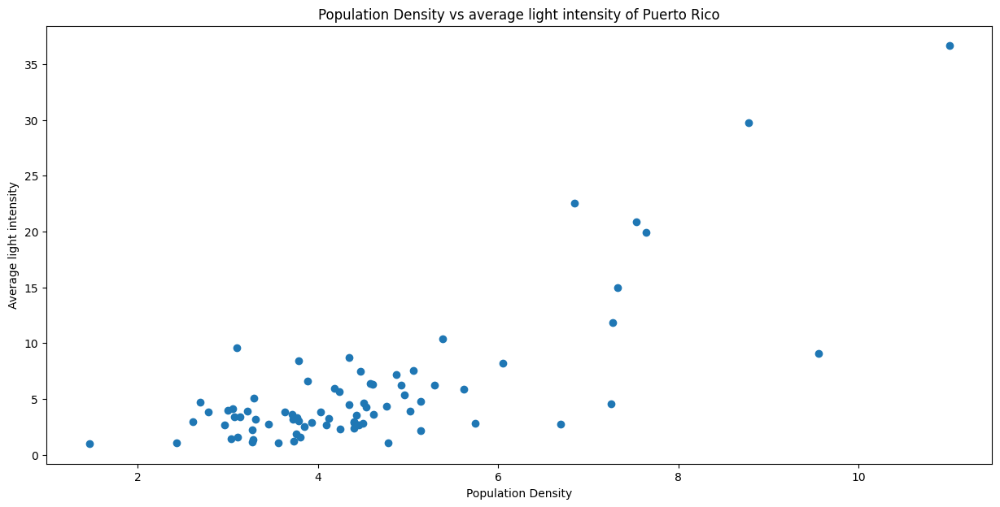

In [ ]:
fig, ax = plt.subplots(figsize=(15,7))

plt.scatter(df_light['dens_mean'],df_light['mean'])
plt.title("Population Density vs average light intensity of Puerto Rico")
plt.xlabel("Population Density")
plt.ylabel("Average light intensity")
plt.show()


*What does the scatter plot above show? Are there any conclusions we can draw from it? How might we support these conclusions?*

*How would you improve this plot? Change some of the plotting parameters to edit it.*



One way to help assess whether there might be some relationship between these two variables is to correlate them.

We will use the Spearman's rank coefficient

In [ ]:
#Calculate Pearson correlation coefficient with the .corr function
df_light.corr('spearman')

,dens_mean,mean
dens_mean,1.000000,0.544734
mean,0.544734,1.000000


*We can see there a moderate correlation between population density and night time light intensity. Is this surprising?*

*Why have we used Spearman's rho instead of Pearson's correlation coefficient? Could we have used either?*

# **Task 4: Making histograms: Difference in light level**

Now that we have established the link between population density and night time light levels, we will look at a different way to inspect the light levels data.

Here we will plot histograms of baseline light intensity for the whole island and for San Juan city, and then for post-hurricane San Juan.

While maps are the main way that you will show remotely sensed data, histograms allow us to inspect the distribution of the data and can tell us what summary statistics are sensible to use.

Additionally, you may wish to use histograms if you have large study areas or large numbers of pixels, or if you are comparing two different sets of study sites across a large region - i.e. one set of pixels with an intervention, another without.

However, making histograms do result in the loss of some of the spatial components of remotely sensed data, so are not always appropriate.


**This task requires converting data from a GEE server side object (and ImageCollection or FeatureCollection) to a Python object (a Dataframe).**

In [ ]:
dataset = ee.ImageCollection('NOAA/VIIRS/001/VNP46A2').filterBounds(pr_adm0)

# Bidirectional Reflectance Distribution Function (BRDF)
brdf = dataset.select('DNB_BRDF_Corrected_NTL')

#We define three periods of time - a baseline, 1 week from the start of the storm, and then a month afterwards

brdf_baseline = brdf.filter(ee.Filter.date('2017-01-01', '2017-08-31'))
brdf_week1 = brdf.filter(ee.Filter.date('2017-09-25', '2017-10-02'))
brdf_week2 = brdf.filter(ee.Filter.date('2017-10-03', '2017-10-31'))
brdf_month6 = brdf.filter(ee.Filter.date('2018-03-25', '2018-04-02'))


#Take the average of these ImageCollections and then clip them just to our study area
pr_brdf_baseline = brdf_baseline.mean().clip(pr_adm0)
pr_brdf_week1 = brdf_week1.mean().clip(pr_adm0)
pr_brdf_week2 = brdf_week2.mean().clip(pr_adm0)
pr_brdf_month6 = brdf_month6.mean().clip(pr_adm0)


There are two ways to make histograms this in the GEE Colab environment by using data from an `Image` or a `FeatureCollection`.

**Image:** The way that we show below is to use the histogram reducer on the image that we are working with and then to convert this to a python dictionary (from a gee dictionary object).

**FeatureCollection:** It is possible to plot a histogram based on a FeatureCollection property, such as the population density property that we showed with a scatter plot above.

**Making a histogram of baseline night time light intensity across the whole island of Puerto Rico.**

In [ ]:
#We already have our baseline image from the above code.
# So here we Reduce the image across our region of interest.
#The region parameter is outline of Puerto Rico.
histogramDictionary = pr_brdf_baseline.reduceRegion(**{
  'reducer': ee.Reducer.histogram(100),                       #Here we use the reducer histogram and set the number of bins that we want
  'geometry': pr_adm0.geometry(),                             #This is our region of interest
  'scale': 500,                                               #This is the resolution of the image
  'maxPixels': 1e19                                           #If the number of pixels exceeds this then GEE will time out
})

#This gives us a GEE Dictionary object which we can inspect below
#This is basically a set of means and frequency values
display(histogramDictionary)


In [ ]:
#To plot this with a python package, we must convert it to a python dictionary object

histogram = histogramDictionary.getInfo()
#display(histogram)


#We then extract the band information
bands = list(histogram.keys())


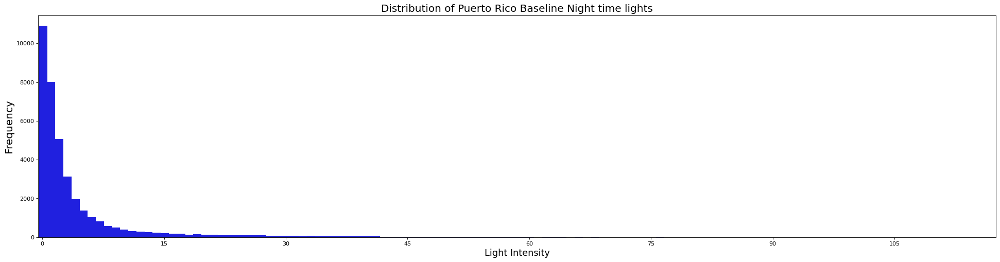

In [ ]:
#We can then loop over this list of values to plot a histogram

for bnd in bands:
    # plot a bar chart

    y=histogram[bnd]['histogram']
    x=[]
    for i in range(len(y)):
        x.append(histogram[bnd]['bucketMin']+i*histogram[bnd]['bucketWidth'])
    data = pd.DataFrame({'x':x,
                             'y':y})

    # Draw Plot
    fig, ax = plt.subplots(figsize=(30, 7), dpi=80)

    sns.barplot(
        data= data,
        x= 'x',
        y= 'y',
        color='blue'
        #ax=ax
    )
    # For every axis, set the x and y major locator
    ax.xaxis.set_major_locator(plt.MaxNLocator(10))


    # Adjust width gap to zero
    for patch in ax.patches:
        current_height = patch.get_width()
        patch.set_width(1)
        patch.set_y(patch.get_y() + current_height - 1)

    # figure label and title
    plt.title('Distribution of Puerto Rico Baseline Night time lights', fontsize=18)
    plt.ylabel('Frequency', fontsize=18)
    plt.xlabel('Light Intensity', fontsize=16)

*Look at the distribution of night time light values. Does this distribution surprise you?*

*In the code below, we will repeat this for the city of San Juan with the same baseline dataset.*

In [ ]:
#Define smaller study area

san_juan = pr_adm1.filter(ee.Filter.eq('ADM1_ES','San Juan'))

#We will clip this image with the smaller study area
sj_prdf_baseline = pr_brdf_baseline.clip(san_juan.geometry())

# Reduce the region. The region parameter is the Feature geometry.
histogramDictionary2 = sj_prdf_baseline.reduceRegion(**{
  'reducer': ee.Reducer.histogram(20),
  'geometry': san_juan.geometry(),
  'scale': 500,
  'maxPixels': 1e19
})

#Convert to a python dictionary object

histogram2 = histogramDictionary2.getInfo()

#Then extract the band information
bands2 = list(histogram2.keys())
bands2

for bnd in bands:
    # plot a bar chart

    y=histogram2[bnd]['histogram']
    x=[]
    for i in range(len(y)):
        x.append(histogram2[bnd]['bucketMin']+i*histogram2[bnd]['bucketWidth'])
    data2 = pd.DataFrame({'x':x,
                             'y':y})

    # Draw Plot
    fig, ax = plt.subplots(figsize=(30, 7), dpi=80)

    sns.barplot(
        data= data2,
        x= 'x',
        y= 'y',
        color='blue'
        #ax=ax
    )
    # For every axis, set the x and y major locator
    ax.xaxis.set_major_locator(plt.MaxNLocator(10))


    # Adjust width gap to zero
    for patch in ax.patches:
        current_height = patch.get_width()
        patch.set_width(1)
        patch.set_y(patch.get_y() + current_height - 1)

    # figure label and title
    plt.title('Histogram for San Juan Baseline Night time lights', fontsize=18)
    plt.ylabel('Frequency', fontsize=18)
    plt.xlabel('Light Intensity', fontsize=16)


*This histogram is actually a sub-set of the one above, as we have just selected a smaller study area. What differences do you notice between them?*

**We now repeat this with the post-storm data for San_Juan.**

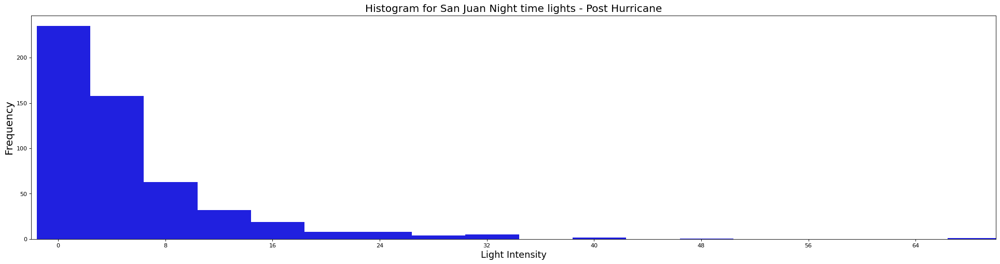

In [ ]:
#Define smaller study area

san_juan = pr_adm1.filter(ee.Filter.eq('ADM1_ES','San Juan'))

#We will clip this image with the smaller study area
sj_prdf_week1 = pr_brdf_week1.clip(san_juan.geometry())

# Reduce the region. The region parameter is the Feature geometry.
histogramDictionary_week1 = sj_prdf_week1.reduceRegion(**{
  'reducer': ee.Reducer.histogram(20),
  'geometry': san_juan.geometry(),
  'scale': 500,
  'maxPixels': 1e19
})

#Convert to a python dictionary object

histogram_week1 = histogramDictionary_week1.getInfo()

#Then extract the band information
bands_week1 = list(histogram_week1.keys())
bands_week1

for bnd in bands:
    # plot a bar chart

    y=histogram_week1[bnd]['histogram']
    x=[]
    for i in range(len(y)):
        x.append(histogram_week1[bnd]['bucketMin']+i*histogram_week1[bnd]['bucketWidth'])
    data_week1 = pd.DataFrame({'x':x,
                             'y':y})

    # Draw Plot
    fig, ax = plt.subplots(figsize=(30, 7), dpi=80)



    sns.barplot(
        data= data_week1,
        x= 'x',
        y= 'y',
        color='blue'
        #ax=ax
    )
    # For every axis, set the x and y major locator
    ax.xaxis.set_major_locator(plt.MaxNLocator(10))


    # Adjust width gap to zero
    for patch in ax.patches:
        current_height = patch.get_width()
        patch.set_width(1)
        patch.set_y(patch.get_y() + current_height - 1)

    # figure label and title
    plt.title('Histogram for San Juan Night time lights - Post Hurricane', fontsize=18)
    plt.ylabel('Frequency', fontsize=18)
    plt.xlabel('Light Intensity', fontsize=16)


*Compare this plot with the one above, noting any differences between them,*

# **Task 5: Making maps with Geemap - Difference in light level**

So far in all of the previous workshops, we have been working with the `geemap` Map function to create interactive maps.

These are useful for viewing and comparing information between different layers.It is possible to improve these maps so that they are closer to publishable quality, however they can be difficult to export and are still lacking elements which are required for high quality printed maps.

Below is some code to add colour bars to the maps.

It is also possible, but not shown below, to export these maps as HTML maps which can can be embedded in virtual media, such as websites.

After this, we will work with a different Python plotting interface for making maps.

**Note: This task involves making a map with a GEE server side object.**


For this activity, we will continue to use the Night time lights dataset and will make plots which are similar to those seen last week.


In [ ]:
dataset = ee.ImageCollection('NOAA/VIIRS/001/VNP46A2').filterBounds(pr_adm0)

# Bidirectional Reflectance Distribution Function (BRDF)
brdf = dataset.select('DNB_BRDF_Corrected_NTL')
brdfVis = {
  'min': 0,
  'max': 100,
  'palette': ['black', 'purple', 'cyan', 'green', 'yellow', 'red', 'white'],
}


#We define three periods of time - a baseline, 1 week from the start of the storm, and then a month afterwards

brdf_baseline = brdf.filter(ee.Filter.date('2017-01-01', '2017-08-31'))
brdf_week1 = brdf.filter(ee.Filter.date('2017-09-25', '2017-10-02'))
brdf_week2 = brdf.filter(ee.Filter.date('2017-10-03', '2017-10-31'))
brdf_month6 = brdf.filter(ee.Filter.date('2018-03-25', '2018-04-02'))


#Take the average of these ImageCollections and then clip them just to our study area
pr_brdf_baseline = brdf_baseline.mean().clip(pr_adm0.geometry())
pr_brdf_week1 = brdf_week1.mean().clip(pr_adm0)
pr_brdf_week2 = brdf_week2.mean().clip(pr_adm0)
pr_brdf_month6 = brdf_month6.mean().clip(pr_adm0)

#Calculate the difference between the baseline and after the storm
brdf_week1_diff = pr_brdf_week1.subtract(pr_brdf_baseline)
brdf_week2_diff = pr_brdf_week2.subtract(pr_brdf_baseline)
brdf_month6_diff = pr_brdf_month6.subtract(pr_brdf_baseline)


#Create a visualisation palette from red (negative change) to white (no change)
diffVis = {
  'min': -100,
  'max': 0,
  'palette': ['ff0000','ffffff'],
}

Map = geemap.Map()
Map.add('Layer_manager')
Map.centerObject(pr_adm0,9)
Map.addLayer(pr_brdf_baseline, brdfVis, 'Baseline BRDF')
Map.addLayer(pr_brdf_week1, brdfVis, 'Week 1 Post Hurricane')
Map.addLayer(brdf_week1_diff,diffVis,'Week 1 Diff')
#Map.addLayer(brdf_week2_diff,diffVis,'Week 2 Diff')
#Map.addLayer(brdf_month6_diff,diffVis,'Month 6 Diff')
Map


One way that we can improve these plots is by adding a **colorbar** to them to make them more readable.

In [ ]:
Map = geemap.Map()
Map.add('Layer_manager')
Map.centerObject(pr_adm0,9)
Map.addLayer(pr_brdf_baseline, brdfVis, 'Baseline BRDF')
Map.addLayer(pr_brdf_week1, brdfVis, 'Week 1 Post Hurricane')
Map.addLayer(brdf_week1_diff,diffVis,'Week 1 Diff')
#Map.addLayer(brdf_week2_diff,diffVis,'Week 2 Diff')
#Map.addLayer(brdf_month6_diff,diffVis,'Month 6 Diff')

#We will also add a colorbar to make this more easily interpritable
#We use the same colorbar that we defined in the code above.
Map.add_colorbar(brdfVis,label="Light Intensity",orientation='horizontal')
Map.add_colorbar(diffVis,label="Week 1 difference from baseline",orientation='horizontal')

Map

Map(center=[18.22243734535054, -66.46814344127438], controls=(WidgetControl(options=['position', 'transparent_…

# **Task 6: Making maps with Cartoee - Difference in light level**

If we want to make high quality maps that we can export easily, one python package to do this is `Cartoee`.

The difference between this package and others is that it is designed to make maps with GEE server side objects. What does this mean? Well it means that you do not have to download the data before making the maps, so if you want to edit your images more and then remake the maps, then this (should) be possible without too much trouble.

It is based upon the `cartopy` package which some of you may be familair with. `Cartoee` is a relatively new package, so you may find some quirks while working with it.

**This task involves making a map with a GEE server side object. This map may be of publishable quality.**


Before you begin, you may find that you need to install the following packages:

In [ ]:
!pip install mss

!pip install geos

!pip install cartopy scipy

In [ ]:
#We will also import some new python packages

from geemap import cartoee
#import cartopy
import cartopy.crs as ccrs
import geos
import cartopy


Below we will make a map of the baseline night time light intensity for Puerto Rico.

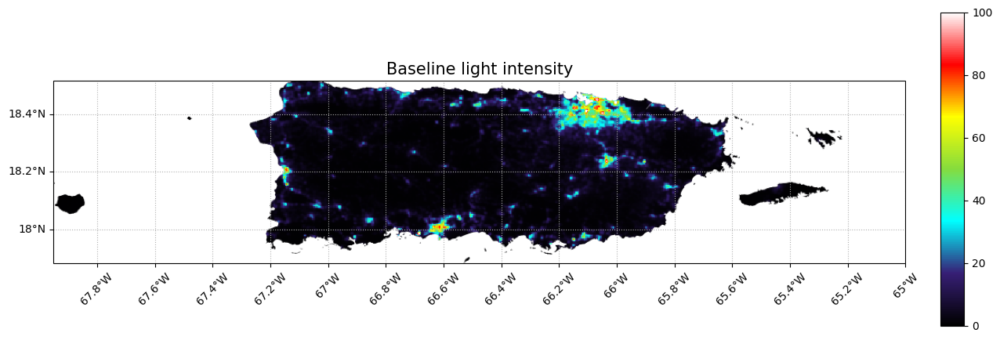

In [ ]:
fig = plt.figure(figsize=(15, 8))

#First we need to redefine the colour palette with hex values in order to make a color bar from it
brdfVis_hex = {
  'min': 0,
  'max': 100,
  'palette': ['#000000', '#371F76', '#00ffff', '#86DC3D', '#FFFF00', '#FF0000', '#FFFFFF'],
}

# plot the result with cartoee. The default map projection is the PlateCarre.
ax = cartoee.get_map(pr_brdf_baseline, vis_params=brdfVis_hex)                          #This creates a map and adds the data to it with a defined colour scale
cb = cartoee.add_colorbar(ax, vis_params=brdfVis_hex, loc='right')                      #This adds a colorbar on the right side of the map

#We can add a title and gridlines to improve the map
ax.set_title(label='Baseline light intensity', fontsize=15)                     #This sets the title of the plot
cartoee.add_gridlines(ax, interval=0.2, xtick_rotation=45, linestyle=":")      #Uset this to change whether you have gridlines on your plot and what the inervals are between them

#ax.coastlines()          #Uncomment this if you want to include coastlines on this plot
plt.draw()

*What is different between the map that you've made here and the interactive geemaps?*

*What is still missing from this map?*

**Improving cartoee map**

You may want to zoom in so that only the island of Puerto Rico is visible, rather than the neighbouring islands. To do this you can define a box that the figure should focus on.

It might also be wise to add a scale bar to your map.

In [ ]:
#First define a zoom box for your map
#Thi takes the format of [E,S,W,N]

zoom = [-67.3, 17.85, -65.50,18.55]           #Feel free to play around with and edit these numbers to change the map extent

fig = plt.figure(figsize=(15, 10))            #Change the size of the figure with this

# plot the result with cartoee using a PlateCarre projection (default)
ax = cartoee.get_map(pr_brdf_baseline, vis_params=brdfVis_hex, region = zoom)
cb = cartoee.add_colorbar(ax, vis_params=brdfVis_hex, loc='right')

ax.set_title(label='Baseline Light intensity', fontsize=15)
cartoee.add_gridlines(ax, interval=0.2, xtick_rotation=45, linestyle=":")

# Here is the code to add a scale bar
#I have set it to 20km, but try to change some of the properties of the scale bar
cartoee.add_scale_bar_lite(
    ax, length=20, xy=(0.1, 0.05), fontsize=20, color="black", unit="km"
)

plt.show()

NameError: ignored

<Figure size 1500x1000 with 0 Axes>

**Plotting Vector Data with Cartoee**

As well as making maps with remotely sensed data, you may also want to make a map from vector data. This could be to show a study area or some value that is aggregated at the regional level.

Below we make a map to show the Administrative Level 1 layers in Puerto Rico.

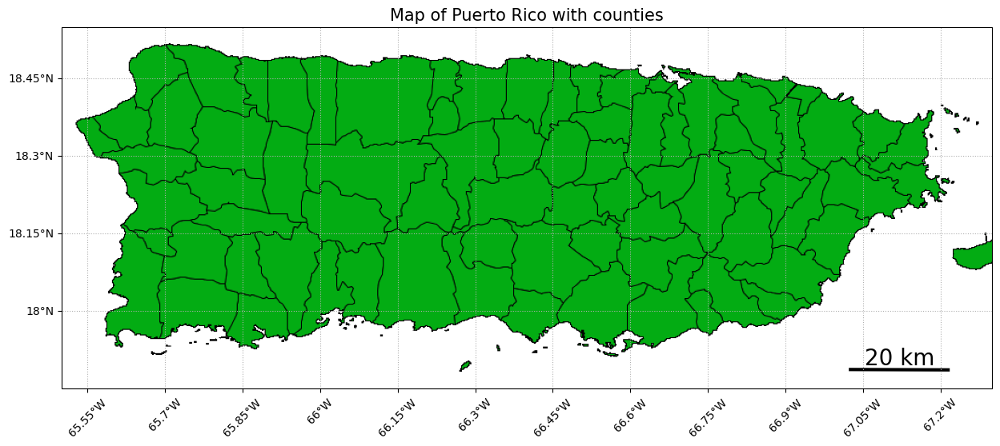

In [ ]:
#Define zoom box
# formatted a [E,S,W,N]

zoom = [-67.3, 17.85, -65.50,18.55]

fig = plt.figure(figsize=(15, 10))
vec_style = {"color": "#000000", "width": 1, "lineType": "solid", "fillColor": "#03AC13"}

# plot the result with cartoee using a PlateCarre projection (default)
ax = cartoee.get_map(pr_adm1, style=vec_style, region = zoom)
#cb = cartoee.add_colorbar(ax, vis_params=brdfVis, loc='right')

ax.set_title(label='Map of Puerto Rico with counties', fontsize=15)
cartoee.add_gridlines(ax, interval=0.15, xtick_rotation=45, linestyle=":")

# Here is the code to add a scale bar - you can change the length of the scale bar
cartoee.add_scale_bar_lite(
    ax, length=20, xy=(0.1, 0.05), fontsize=20, color="black", unit="km"
)

plt.show()

We might want to colour our vector plot according to one of its properties. Here we will do this for the population density values.

For ease, we will use a pre-made colour palette for this. Geemap has a built in function for calling in colormaps.



In [ ]:
import geemap.colormaps as cm


In [ ]:
#Uncomment this code if you want to see all of the pre-defined colormaps which are available

#cm.plot_colormaps(width=12, height=0.4)


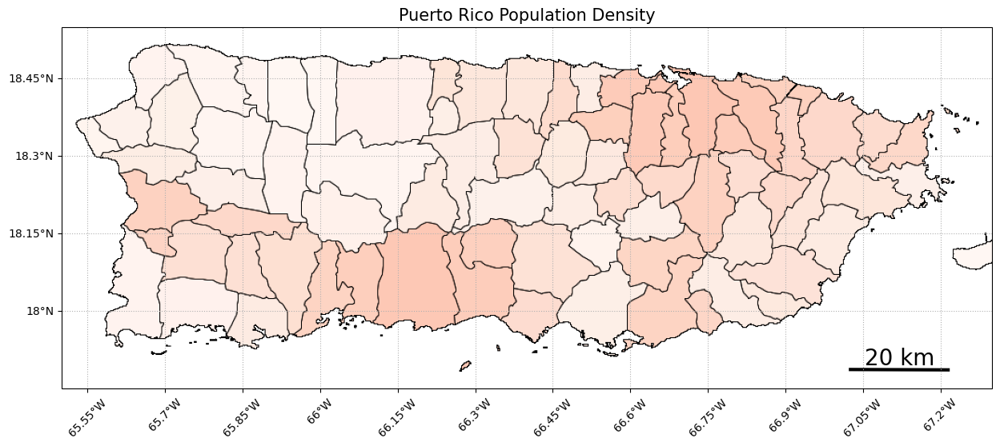

In [ ]:
#Define zoom box
# formatted a [E,S,W,N]

zoom = [-67.3, 17.85, -65.50,18.55]

fig = plt.figure(figsize=(15, 10))

#We must now define a colour palette and map it onto our FeautreCollection
#We use the pre-set colormap 'Reds'
dens_palette = cm.palettes.Reds

#We will then map this colour palette onto the Puerto Rico Admin1 collection
features_styled = geemap.vector_styling(pr_adm1, column="dens_mean", palette=dens_palette)


# plot the result with cartoee using a PlateCarre projection (default)
ax = cartoee.get_map(features_styled, region = zoom)

ax.set_title(label='Puerto Rico Population Density', fontsize=15)
cartoee.add_gridlines(ax, interval=0.15, xtick_rotation=45, linestyle=":")

# Here is the code to add a scale bar - you can change the length of the scale bar
cartoee.add_scale_bar_lite(
    ax, length=20, xy=(0.1, 0.05), fontsize=20, color="black", unit="km"
)

plt.show()

It is possible to save any of the figures that we have made above by right clicking them and clicking save as.

# **Task 7: Plotting time series**

One additional way that we will show for plotting data with Python is to plot time series.

You should be fairly faimiliar with this, as we have done it in previous weeks, so this is just repeated here to remind you.


**This task requires converting data from a GEE server side object (and ImageCollection or FeatureCollection) to a Python object (a Dataframe).**

In [ ]:
#Import new Python packages

import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

In [ ]:
dataset = ee.ImageCollection('NOAA/VIIRS/001/VNP46A2').filterBounds(pr_adm0)

#Create a function to calculate the spatial mean for our study area for each image in the collection
def average_light(img):
  mean_brdf = img.reduceRegion(reducer=ee.Reducer.mean(),geometry=pr_adm0,scale=500).get('DNB_BRDF_Corrected_NTL')
  return img.set('brdf_mean',mean_brdf)


average_light_reduced = dataset.map(average_light)

#display(average_light_reduced)

light_nested_list = average_light_reduced.reduceColumns(ee.Reducer.toList(2), ['system:time_start'.format("yyyy-MM-dd"),'brdf_mean']).values().get(0)

display(light_nested_list)



In [ ]:
#We must convert this into a dataframe

df_light = pd.DataFrame(light_nested_list.getInfo(), columns=['system:time_start','brdf_mean'])

#If we want to have the "time_start" in a more readable form
#We can convert this with the to_datetime command and add this date as an extra olumn

df_light['date'] = pd.to_datetime(df_light['system:time_start'],unit='ms').dt.date

#Note the extra ".dt.date" command removes the time component of the date

#We can also calculate a rolling average to help smooth out noise in our time series
#To do this we use the .rolling(window).mean() command
#We will use a window of 7 (days) to start with
window_size = 7
df_light['brdf_ma'] = df_light['brdf_mean'].rolling(window_size).mean()

#To make it easier to plot, we will create a new dataframe and remove the system:time_start column
#As we have converted this into a readable date component
old_df_light = df_light
df_light = df_light.drop('system:time_start', axis=1)


display(df_light)

,brdf_mean,date,brdf_ma
0,4.907956,2012-01-19,NaN
1,6.025343,2012-01-20,NaN
2,5.608218,2012-01-21,NaN
3,5.795879,2012-01-22,NaN
4,7.172492,2012-01-23,NaN
...,...,...,...
4141,11.535898,2023-11-11,5.280700
4142,5.890242,2023-11-12,5.396284
4143,4.476692,2023-11-13,5.176975
4144,3.619612,2023-11-14,4.923212


In [ ]:
# We can define an initial figure with dimensions of 15 x 7
fig, ax = plt.subplots(figsize=(15,7))

# We can then use seaborn lineplot to make the figure
# Here our data argument is our initial dataframe, and we select two of the columns as the x and y values
sns.lineplot(data=pd.melt(df_light,['date']), x="date",y='value',hue='variable')


# We can then set the labels and title
ax.set_ylabel('Average light',fontsize=20)
ax.set_xlabel('Date',fontsize=20)
ax.set_title('Night time light time series');


*How might you want to use time series in your coursework to represent remotely sensed data? What advantage does it have over mapping data? What disadvantages?*

*If you wish to adapt this code, try to remake this time series for one of the Puerto Rico counties. Look at how it differs from this time series.*

# **Task 8: Exporting light intensity raster data from GEE**




We will export some of our data to work with it on QGIS. This will give you an idea of the difference between GEE and QGIS for making maps.

Below is the code to export your light intensity baseline raster.

Edit the code afterwards to export the Week 1 and 6 month images.

In [ ]:
#We will export the night time lights data for before the hurricane
#1 week after the hurricane and 6 months afterwards


#Here is the code to export the brdf_baseline
#Now edit this to do the same for the week1 and 6 month images
task = geemap.ee_export_image_to_drive(
    pr_brdf_baseline,                   #This is the image that you want to export to your Google drive
    description='BRDF_Puerto_Rico_Week1',        #This will be the name of the raster file that is exported
    folder='Week 11 export',                     #This will create a folder in your Google Drive to export the data to
    region=pr_adm0.geometry(),                             #As our ROI is a feature, we have to get GEE to use its geometry as the region
    scale=500                                   #This is the export resolution in metres - set here to 500 as this is the native image resolution
)



# **Task 9: Exporting flooding data from GEE**



This is a repeat of last weeks exercise of mapping floods in Kherson with Sentinel-1 data. There is now additional code to calculate the flood extent from a later image as well.

Download these rasters and plot them in QGIS.

In [ ]:
#We define our Region of Interest

dam_roi = ee.Geometry.Point([33.246936,46.774588])

In [ ]:
#This is an adapted version of the standard GEE code for importing and working with S1 data

def mask_edge(image):
  edge = image.lt(-30.0)
  masked_image = image.mask().And(edge.Not())
  return image.updateMask(masked_image)


#This code calls in the S1 ImageCollection
S1_vv = (
    ee.ImageCollection('COPERNICUS/S1_GRD')
    .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))          #S1 images are polarised - vertical or horizontal. VV here are vertical for transmission and reception
    .filter(ee.Filter.eq('instrumentMode', 'IW'))                                     #Select Interferometric Wide Swath - this is the standard acquisation mode over land
    .filterBounds(dam_roi)
    .select('VV')
    .map(mask_edge)
)

#Here we filter the ccollection into two different time periods
S1_vv_baseline = S1_vv.filter(ee.Filter.date('2023-05-01','2023-05-31'))
S1_vv_baseline_composite = S1_vv_baseline.median()
S1_vv_flood = S1_vv.filter(ee.Filter.date('2023-06-06','2023-06-20'))


Map = geemap.Map()
Map.add('Layer_manager')
Map.centerObject(dam_roi,8)
Map.add_layer(S1_vv_baseline.mean(),{'min': -50, 'max': 5},'Baseline',True)
Map.add_layer(S1_vv_flood.mean(),{'min': -50, 'max': 5},'Flood',True)
Map.add_layer(dam_roi,{'color':'ff0000'},'ROI')
Map
#display(S1_vv_flood.first().date())         #Show date of first Image in Collection

Map(center=[46.774588, 33.246936000000005], controls=(WidgetControl(options=['position', 'transparent_bg'], wi…

Now we will calculate the changes in surface roughness to approximate the flooding area.

In [ ]:
#Sentinel-1 images can be reduced in quality due to interference, known as speckle noise.
#The effects of this can be mitigated by applying some spatial statistical filter
#One very simple way to do this is to take an average around each pixel, which we will do here
#Other ways include calculating a Lee speckle filter

radius = 30
sample_image = S1_vv_baseline.first()
sample_image_smoothed = sample_image.focalMedian(radius,'circle','meters')


Map = geemap.Map()
Map.add('Layer_manager')
Map.centerObject(dam_roi,8)
#Map.add_layer(sample_image,{'min': -50, 'max': 5},'Before Smoothing',True)
#Map.add_layer(sample_image_smoothed,{'min': -50, 'max': 5},'After Smoothing',True)

#Map


In [ ]:
#We will apply our smoothing to all images in our study area

def spatial_smoother(image):
  radius = 30
  image_smoothed = image.focalMedian(radius,'circle','meters')
  return image_smoothed


S1_vv_baseline_composite = S1_vv_baseline_composite.focalMedian(radius,'circle','meters')     #This is a single image, so we can apply the spatial smoother directly
S1_vv_flood = S1_vv_flood.map(spatial_smoother)                                               #This is a collection, so we must map the spatial smoother over every image

#We select the second image of flood coverage
S1_vv_flood_list = S1_vv_flood.toList(999)
S1_vv_flood2 = ee.Image(ee.List(S1_vv_flood_list).get(2))
#S1_vv_flood2 = S1_vv_flood.filter(ee.Filter.date('2023-06-10','2023-06-15'))                                          #This is a collection, so we must map the spatial smoother over every image


#We can calculate the difference in the backscatter coefficient between these time periods
diff = S1_vv_flood.first().subtract(S1_vv_baseline_composite)
diff2 = S1_vv_flood2.subtract(S1_vv_baseline_composite)

#We have to choose a threshold to distinguish between flooded and non-flooded pixels
#The one given below is somewhat arbitrary and has been chosen through trial and error
#The threshold will change depending on the flood and the images.
threshold = -4;

flood_diff_thresholded = diff.lt(threshold);
flood_diff2_thresholded = diff2.lt(threshold);

#We can then turn this into a binary image with only flooded pixels shown
flood_binary = flood_diff_thresholded.updateMask(flood_diff_thresholded)
flood_binary2 = flood_diff2_thresholded.updateMask(flood_diff2_thresholded)


Map = geemap.Map()
Map.add('Layer_manager')
Map.centerObject(dam_roi,8)
Map.addLayer(S1_vv_baseline_composite, {'min':-50,'max':5}, 'Baseline');
Map.addLayer(S1_vv_flood, {'min':-50,'max':5}, 'Flood');
Map.addLayer(S1_vv_flood2, {'min':-50,'max':5}, 'Flood2');
Map.addLayer(diff, {'min':-10,'max':10}, 'diff');
Map.addLayer(flood_binary, {'palette':"0000FF"},'flooded areas - blue')
Map.addLayer(flood_binary2, {'palette':"0084ff"},'flooded areas 2 - blue')
Map
#display(S1_vv_flood2)

Map(center=[46.774588, 33.246936000000005], controls=(WidgetControl(options=['position', 'transparent_bg'], wi…

*You may see that some of the pixels in the sea are marked as flooding. Why might this be?*

In [ ]:
#We will filter out any pixel which is usually a body of water
#For this we will use a pre-existing map of water coverage

water_coverage = ee.Image('JRC/GSW1_0/GlobalSurfaceWater').select('seasonality');
water_coverage_mask = water_coverage.gte(12).updateMask(water_coverage.gte(12));

#Any area where there is water coverage every month of the year is assigned a 0 value
flooded_mask = flood_binary.where(water_coverage_mask,0);
flooded_mask2 = flood_binary2.where(water_coverage_mask,0);

#We then mask out these pixels
flooded = flooded_mask.updateMask(flooded_mask);
flooded2 = flooded_mask2.updateMask(flooded_mask);

In [ ]:
#We can also see that there is some noise in the image, with isolated pixels showing up as flooded.
#We may only want to include pixels which are connected to others

connected_pixels = flooded.connectedPixelCount()
connected_pixels2 = flooded2.connectedPixelCount()

flooded_updated = flooded.updateMask(connected_pixels.gte(6))
flooded_updated2 = flooded2.updateMask(connected_pixels2.gte(6))


Map = geemap.Map()
Map.add('Layer_manager')
Map.centerObject(dam_roi,8)
Map.addLayer(flooded_updated, {'palette':"008cff"},'First flooded areas updated - blue')
Map.addLayer(flooded_updated2, {'palette':"34ebe1"},'Second flooded areas updated - blue')

Map


Map(center=[46.774588, 33.246936000000005], controls=(WidgetControl(options=['position', 'transparent_bg'], wi…

We are now going to export these layers within a certain extent.

We will export them as two seperate rasters.

In [ ]:
#Define our study area:

ukr_adm2 = ee.FeatureCollection('projects/ee-joshuabuxton2018/assets/ukr_admin2_borders')

kherson_roi = ukr_adm2.filter(ee.Filter.eq('ADM2_EN','Khersonskyi'))

#Add a buffer of 5km around our ROI
kherson_roi_buffer = kherson_roi.geometry().buffer(5000)

Map.addLayer(kherson_roi,{'color':'FF0000'},'Kherson')
Map.addLayer(kherson_roi_buffer,{'color':'0000FF'},'Kherson Buffer')

In [ ]:
#We will export the flood data for our ROI
#Repeat this for the second flood image afterwards


#Here is the code to export the brdf_baseline
#Now edit this to do the same for the week1 and 6 month images
task = geemap.ee_export_image_to_drive(
    flooded_updated,                                       #This is the image that you want to export to your Google drive
    description='First Kherson Flood Image',               #This will be the name of the raster file that is exported
    folder='Week 11 export',                               #This will create a folder in your Google Drive to export the data to
    region=kherson_roi_buffer,                             #As our ROI is a feature, we have to get GEE to use its geometry as the region
    scale=10,                                              #This is the export resolution in metres - set here to 30 as this is the native Landsat resolution
    maxPixels = 130000000
)



In [ ]:
#You will also want to export your ROI
#Do this as a shapefile or GeoJSON

#If we want to use these geometries again, we can conver them to a FeatureCollection
#Then we can export them to Google Drive

task = ee.batch.Export.table.toDrive(
    collection=ee.FeatureCollection(kherson_roi_buffer),
    description='Kherson_ROI_buffer',
    folder='Week 11 exports',
    fileFormat='SHP'
)

task.start()

## get the status of task while it runs every 30 sec
import time
while task.active():
    time.sleep(30)
    display(task.status())


{'state': 'COMPLETED',
 'description': 'kherson_city_roi',
 'creation_timestamp_ms': 1701695154704,
 'update_timestamp_ms': 1701695180012,
 'start_timestamp_ms': 1701695168231,
 'task_type': 'EXPORT_FEATURES',
 'destination_uris': ['https://drive.google.com/#folders/1hg2uIYXQ0SKJyxzAlOZJoaX8tmTBbagm'],
 'attempt': 1,
 'batch_eecu_usage_seconds': 0.05950816348195076,
 'id': 'Z5W4BFCMRUVROBECLQLOEHXY',
 'name': 'projects/earthengine-legacy/operations/Z5W4BFCMRUVROBECLQLOEHXY'}

Once you have succesfully exported both images, create a new QGIS project and make a map showing the flooding extent in Kherson

# **Javascript to Python converter**

In [ ]:

js_code =  """
"""

In [ ]:
#Here extract the new python code and print it

lines = geemap.js_snippet_to_py(
    js_code, add_new_cell=False, import_ee=False, import_geemap=False, show_map=True
)

for line in lines:
    print(line.rstrip())


Export.table.toDrive({
           'collection': DataRenamed,
           'description': 'NAME',
           'fileFormat': 'CSV',
           'selectors': ['SE_score', 'id']})
Map
